# Import Necessary Library

In [ ]:
#Importing Libraries
import tensorflow as tf
import numpy as np
import pandas as pd
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
import matplotlib.patches as mpatches
import sys
import warnings
import os
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Dropout, GRU, Concatenate, Lambda
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

In [ ]:
# enables music21 to render images of musical notes
print('installing lilypond...')
!apt-get install lilypond > /dev/null

# converts midi files to wav files into order to play them
print('installing fluidsynth...')
!apt-get install fluidsynth > /dev/null
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2

print('installing musescore...')
!apt install musescore3 > /dev/null

print('done!')

installing lilypond...
Extracting templates from packages: 100%
installing fluidsynth...
Extracting templates from packages: 100%
installing musescore...


done!


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import auth
auth.authenticate_user()

# Data Gathering & Preprocessing

## Gather, Sampling and Key Transposing

In [ ]:
#Loading the list of chopin's midi files as stream
filepath = "/content/drive/MyDrive/ClassicalMusic/chopin/"
#Getting midi files
all_midis= []
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+i
        midi_ut = converter.parse(tr)
        midi = midi_ut.stripTies()
        all_midis.append(midi)


Gather all midis file and transpose the key of the all music to middle C

In [ ]:
all_midis = all_midis[:2]

Select 2 only chopin music.

## Music Functions

In [ ]:
def show(music):
  display(Image(str(music.write('lily.png'))))

def play(music):
  filename = music.write('mid')
  !fluidsynth -ni font.sf2 $filename -F $filename\.wav -r 16000 > /dev/null
  display(Audio(str(filename) + '.wav'))

defining functions to produce a music sheet and music audio

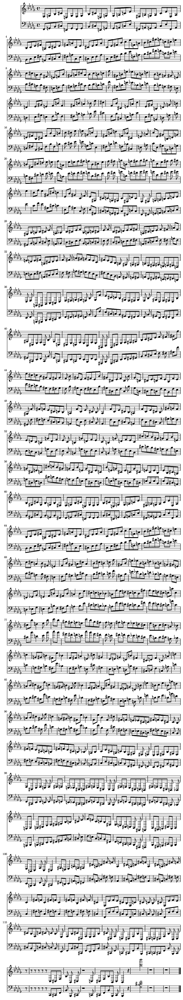

In [ ]:
show(all_midis[1])

In [ ]:
play(all_midis[1])

## Clef Splitting

In [ ]:
def split_part(midis):
  all_midis_parts = []

  for midi in midis:
    for i in range(len(midi.parts)):
      all_midis_parts.append(midi.parts[i])

  return all_midis_parts

In [ ]:
all_midi_split = split_part(all_midis)

split the midi file into parts

In [ ]:
len(all_midi_split)

4

Each of the music composed of two part which is also means two clef. There are total of 2 midi file, therefore, there are 4 parts in total.

In [ ]:
def split_clef(midis_parts):
  treble_clef_midi = []
  bass_clef_midi = []

  for midi in midis_parts:
    for element in midi.flat:

      clef_name = None

      if isinstance(element, music21.clef.Clef):
        clef_name = str(element.name)

        if clef_name  == 'treble':
          treble_clef_midi.append(midi)

        elif clef_name == 'bass':
          bass_clef_midi.append(midi)

  return treble_clef_midi, bass_clef_midi


In [ ]:
treble_midis, bass_midis = split_clef(all_midi_split)

Each of the part was looked for their clef property, the part with same clef property will be group together, i.e. part with treble clef property belongs to treble clef while part with bass clef property belongs to bass clef.  

In [ ]:
treble_midis

[<music21.stream.Part 0x7c1a6fc48190>, <music21.stream.Part 0x7c1a6ec4cb50>]

In [ ]:
bass_midis

[<music21.stream.Part 0x7c1a6f5c9960>, <music21.stream.Part 0x7c1a6e419cf0>]

## Duplicates

In [ ]:
duplicates = [element for element in bass_midis if element in treble_midis]
print(duplicates)

[]


No duplicates data

## Music Element Extraction

In [ ]:
def extract_notes_all(midi_clef):

  notes = []
  durations = []
  #types = []
  sequence_num = []

  for midi_part in midi_clef:
    for element in midi_part.flat:
      note_name = None
      duration_name  = None


    #if isinstance(element, music21.key.Key):
    # note_name = str(element.tonic.name) + ':' + str(element.mode)
    #  duration_name = "0.0"

    #elif isinstance(element, music21.meter.TimeSignature):
    #  note_name = str(element.ratioString) + 'TS'
    #  duration_name = "0.0"

      if isinstance(element, music21.chord.Chord):
        note_name = []
        duration_name = []
        for i in element.pitches:
          note_name.append(i.nameWithOctave)
        #note_name = element.pitches[-1].nameWithOctave
        #note_name = element
          #duration_name.append(element.duration.quarterLength)
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Rest):
        note_name = str(element.name)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Note):
        note_name = str(element.nameWithOctave)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      if note_name and duration_name:
        notes.append(note_name)
        durations.append(duration_name)

  return notes, durations

In [ ]:
bass_midis_element = extract_notes_all(bass_midis)
treble_midis_element = extract_notes_all(treble_midis)

The music element such as notes, chords and durations will be extracted for each clef. Noted that, each music elements of treble and bass clef are remains separated. The notes and chords are grouped together under the same feature while durations itself become another feature.

In [ ]:
bass_midis_element

(['F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'C#2',
  'G3',
  'B-3',
  'G#3',
  'B3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'C#2',
  'G3',
  'B-3',
  'G#3',
  'B3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'E-2',
  'A3',
  'C4',
  'B-3',
  'E-4',
  'F#3',
  'G#2',
  'G3',
  'B-3',
  'G#3',
  'C#4',
  'F3',
  'rest',
  'G#2',
  'G3',
  'B-3',
  'G#3',
  'C4',
  'E-3',
  'C#3',
  'G3',
  'B-3',
  'G#3',
  'C#4',
  'F3',
  'G#3',
  'F#3',
  'B3',
  'E-3',
  'F#3',
  'F3',
  'B-3',
  'C#3',
  'B-3',
  'B2',
  'B-3',
  'G#3',
  'rest',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3',
  'B-3',
  'C#3',
  'F#2',
  'F3',
  'G#3',
  'F#3'

In [ ]:
len(bass_midis_element[0])

1337

In [ ]:
len(bass_midis_element[1])

1337

In [ ]:
treble_midis_element

([['C#4', 'F#4', 'B-4'],
  ['F#4', 'C#4', 'B-4'],
  ['C#4', 'B-4', 'F#4'],
  'rest',
  'F4',
  'B4',
  'G#4',
  ['F#4', 'B-4', 'C#4'],
  'rest',
  'C#4',
  ['F#4', 'B-4'],
  ['B-4', 'F#4'],
  'C#4',
  ['B-4', 'F#4'],
  'rest',
  ['B4', 'G#4'],
  ['B-4', 'F#4'],
  'rest',
  ['F4', 'G#4'],
  'rest',
  ['B-4', 'F#4'],
  'rest',
  'F4',
  ['C#5', 'B-4'],
  'rest',
  ['B4', 'G#4'],
  'rest',
  'rest',
  ['G#4', 'C#4'],
  ['C#4', 'F#4', 'B-4'],
  ['B-4', 'C#4', 'C#5'],
  ['B-4', 'F#5', 'F#4'],
  'rest',
  ['C#5', 'F5', 'G#4'],
  ['F#4', 'G#4'],
  'F5',
  'E-5',
  ['F#4', 'G#4'],
  'rest',
  ['F4', 'C#5', 'G#4'],
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'B-3',
  ['F#4', 'B-4', 'C#4'],
  ['C#4', 'F#4', 'B-4'],
  ['F#4', 'B-4'],
  'C#4',
  'rest',
  ['B4', 'F4'],
  'G#4',
  ['F#4', 'C#4', 'B-4'],
  'rest',
  ['C#4', 'B-4'],
  'F#4',
  'rest',
  [

In [ ]:
len(treble_midis_element[0])

1190

In [ ]:
len(treble_midis_element[1])

1190

## Dataframe Construction

In [ ]:
bass_df = pd.DataFrame(bass_midis_element).T
bass_df.columns = ['music_element', 'duration']
bass_df

,music_element,duration
0,F#2,0.5
1,F3,0.5
2,G#3,0.5
3,F#3,0.5
4,B-3,0.5
...,...,...
1332,B-1,1.0
1333,rest,1.0
1334,"[F3, F4, C#4, B-3]",2.0
1335,rest,4.0


In [ ]:
treble_df = pd.DataFrame(treble_midis_element).T
treble_df.columns = ['music_element', 'duration']
treble_df

,music_element,duration
0,"[C#4, F#4, B-4]",3.0
1,"[F#4, C#4, B-4]",3.0
2,"[C#4, B-4, F#4]",3.0
3,rest,3.0
4,F4,3.0
...,...,...
1185,B-2,1.0
1186,rest,1.0
1187,"[B-6, B-5]",2.0
1188,rest,4.0


There are total two dataframe constructed for each clef. Each dataframe consist of two features. The first feature named as 'music_element' where it consist of notes and chords while second feature named as 'duration' where it consist of duration only.

## Data Transformation

In [ ]:
chords_list_tr = []
for i in treble_df['music_element']:
  if type(i) == list:
    chords_list_tr.append(i)

In [ ]:
chords_list_tr

[['C#4', 'F#4', 'B-4'],
 ['F#4', 'C#4', 'B-4'],
 ['C#4', 'B-4', 'F#4'],
 ['F#4', 'B-4', 'C#4'],
 ['F#4', 'B-4'],
 ['B-4', 'F#4'],
 ['B-4', 'F#4'],
 ['B4', 'G#4'],
 ['B-4', 'F#4'],
 ['F4', 'G#4'],
 ['B-4', 'F#4'],
 ['C#5', 'B-4'],
 ['B4', 'G#4'],
 ['G#4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['B-4', 'C#4', 'C#5'],
 ['B-4', 'F#5', 'F#4'],
 ['C#5', 'F5', 'G#4'],
 ['F#4', 'G#4'],
 ['F#4', 'G#4'],
 ['F4', 'C#5', 'G#4'],
 ['F#4', 'B-4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['F#4', 'B-4'],
 ['B4', 'F4'],
 ['F#4', 'C#4', 'B-4'],
 ['C#4', 'B-4'],
 ['C#4', 'B-4', 'F#4'],
 ['F#4', 'B-4', 'C#4'],
 ['C#4', 'F#4', 'B-4'],
 ['F#4', 'B-4', 'C#4'],
 ['B-4', 'F#4', 'C#4'],
 ['F#4', 'B-4'],
 ['G#4', 'B4'],
 ['F#4', 'B-4'],
 ['G#4', 'F4'],
 ['B-4', 'F#4'],
 ['B-4', 'C#5'],
 ['G#4', 'B4'],
 ['C#4', 'G#4'],
 ['E4', 'C#4', 'B-4'],
 ['B-4', 'E4'],
 ['B-4', 'E4', 'C#5'],
 ['E4', 'E-5', 'B-4'],
 ['C#5', 'E4', 'B-4'],
 ['G#4', 'B4', 'E-4'],
 ['C#4', 'G4', 'B-4'],
 ['G#4', 'B3', 'B4'],
 ['G#4', 'B3'],
 ['B-4', 'C#4'],
 [

In [ ]:
chords_list_bs = []
for i in bass_df['music_element']:
  if type(i) == list:
    chords_list_bs.append(i)

In [ ]:
chords_list_bs

[['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'E-4'],
 ['E-3', 'B-3'],
 ['E-3', 'B-3'],
 ['E-3', 'C#4'],
 ['E-3', 'C4'],
 ['E-3', 'B-3'],
 ['G#2', 'B-3'],
 ['G#2', 'G#3'],
 ['G#3', 'G#2'],
 ['C#3', 'G#3'],
 ['E-3', 'G#3'],
 ['C#3', 'G#3'],
 ['G#2', 'G#3'],
 ['C#3', 'G#3'],
 ['E-3', 'G#3'],
 ['C#3', 'G#3'],
 ['F#3', 'G#3'],
 ['F3', 'G#3'],
 ['G#2', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'C#4'],
 ['C#3', 'G#3'],
 ['C#3', 'G#3'],
 ['C#3', 'B3'],
 ['C#3', 'B-3'],
 ['C#3', 'G#3'],
 ['F#2', 'G#3'],
 ['F#2', 'F#3'],
 ['F#3', 'F#2'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['E-3', 'F#3'],
 ['F#3', 'E-3'],
 ['E-3', 'F#3'],
 ['E-3', 'F#3'],
 ['C#3', 'F#3'],
 ['C#3', 'F#3'],
 ['B2', 'F#3'],
 ['F#3', 'B2'],
 ['B2', 'F#3'],
 ['B2', 'F#3'],
 ['C#3', 'F#3'],
 ['C#3', 'F#3'],
 ['E-3', 'F#3'],
 ['F#3', 'E-3'],
 ['B2', 'F#3'],
 ['B2', 'F

In [ ]:
unique_chords_tr = list(np.unique(np.array(chords_list_tr, dtype = object)))

In [ ]:
chords_dict_tr = dict()
for i in range(len((unique_chords_tr))):
  if type(unique_chords_tr[i]) == list:
    chords_dict_tr[str('CH') + str(i)] =unique_chords_tr[i]

In [ ]:
chords_dict_tr

{'CH0': ['B-3', 'A4'],
 'CH1': ['B-3', 'C#4', 'B-4'],
 'CH2': ['B-3', 'F#4'],
 'CH3': ['B-4', 'B-3'],
 'CH4': ['B-4', 'B-3', 'C#4'],
 'CH5': ['B-4', 'C#4'],
 'CH6': ['B-4', 'C#4', 'C#5'],
 'CH7': ['B-4', 'C#5'],
 'CH8': ['B-4', 'C#5', 'E4'],
 'CH9': ['B-4', 'E4'],
 'CH10': ['B-4', 'E4', 'C#5'],
 'CH11': ['B-4', 'F#4'],
 'CH12': ['B-4', 'F#4', 'C#4'],
 'CH13': ['B-4', 'F#5', 'F#4'],
 'CH14': ['B-6', 'B-5'],
 'CH15': ['B3', 'F4'],
 'CH16': ['B3', 'G#4'],
 'CH17': ['B4', 'E-4'],
 'CH18': ['B4', 'F4'],
 'CH19': ['B4', 'G#4'],
 'CH20': ['C#4', 'B-4'],
 'CH21': ['C#4', 'B-4', 'F#4'],
 'CH22': ['C#4', 'C#5'],
 'CH23': ['C#4', 'F#4', 'B-4'],
 'CH24': ['C#4', 'F4'],
 'CH25': ['C#4', 'G#4'],
 'CH26': ['C#4', 'G4', 'B-4'],
 'CH27': ['C#4', 'G4', 'B4'],
 'CH28': ['C#5', 'B-3'],
 'CH29': ['C#5', 'B-4'],
 'CH30': ['C#5', 'C#4'],
 'CH31': ['C#5', 'E4', 'B-4'],
 'CH32': ['C#5', 'F5', 'G#4'],
 'CH33': ['E-4', 'B-4'],
 'CH34': ['E-4', 'B4', 'G#4'],
 'CH35': ['E-4', 'G#4'],
 'CH36': ['E-4', 'G#4', 'B3'],

In [ ]:
unique_chords_bs = list(np.unique(np.array(chords_list_bs, dtype = object)))

In [ ]:
chords_dict_bs = dict()
for i in range(len((unique_chords_bs))):
  if type(unique_chords_bs[i]) == list:
    chords_dict_bs[str('CH') + str(i)] =unique_chords_bs[i]

In [ ]:
chords_dict_bs

{'CH0': ['B-2', 'F#3'],
 'CH1': ['B2', 'F#3'],
 'CH2': ['B2', 'G#3'],
 'CH3': ['C#3', 'B-3'],
 'CH4': ['C#3', 'B3'],
 'CH5': ['C#3', 'C#4'],
 'CH6': ['C#3', 'F#2'],
 'CH7': ['C#3', 'F#3'],
 'CH8': ['C#3', 'G#3'],
 'CH9': ['E-3', 'B-3'],
 'CH10': ['E-3', 'C#4'],
 'CH11': ['E-3', 'C4'],
 'CH12': ['E-3', 'E-4'],
 'CH13': ['E-3', 'F#3'],
 'CH14': ['E-3', 'G#3'],
 'CH15': ['F#2', 'C#3'],
 'CH16': ['F#2', 'E-3'],
 'CH17': ['F#2', 'F#3'],
 'CH18': ['F#2', 'F3'],
 'CH19': ['F#2', 'G#3'],
 'CH20': ['F#3', 'B2'],
 'CH21': ['F#3', 'E-3'],
 'CH22': ['F#3', 'F#2'],
 'CH23': ['F#3', 'G#3'],
 'CH24': ['F3', 'F4', 'C#4', 'B-3'],
 'CH25': ['F3', 'G#3'],
 'CH26': ['G#2', 'B-3'],
 'CH27': ['G#2', 'E-3', 'G#3'],
 'CH28': ['G#2', 'G#3'],
 'CH29': ['G#3', 'C#3'],
 'CH30': ['G#3', 'G#2']}

In [ ]:
unique_duration_tr = list(np.unique(np.array(treble_df['duration'])))

In [ ]:
duration_dict_tr = dict()
for i in range(len((unique_duration_tr))):
    duration_dict_tr[str('DR') + str(i)] =unique_duration_tr[i]

In [ ]:
duration_dict_tr

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.4166666666666667,
 'DR5': 0.5,
 'DR6': 0.5833333333333334,
 'DR7': 0.6666666666666666,
 'DR8': 0.75,
 'DR9': 1.0,
 'DR10': 1.25,
 'DR11': 1.3333333333333333,
 'DR12': 1.5,
 'DR13': 2.0,
 'DR14': 2.25,
 'DR15': 2.5,
 'DR16': 2.75,
 'DR17': 3.0,
 'DR18': 3.5,
 'DR19': 4.0,
 'DR20': 5.25,
 'DR21': 5.5,
 'DR22': 5.75,
 'DR23': 6.0}

In [ ]:
unique_duration_bs = list(np.unique(np.array(bass_df['duration'])))

In [ ]:
duration_dict_bs = dict()
for i in range(len((unique_duration_bs))):
    duration_dict_bs[str('DR') + str(i)] =unique_duration_bs[i]

In [ ]:
duration_dict_bs

{'DR0': 0.25,
 'DR1': 0.3333333333333333,
 'DR2': 0.5,
 'DR3': 0.6666666666666666,
 'DR4': 1.0,
 'DR5': 2.0,
 'DR6': 3.0,
 'DR7': 4.0,
 'DR8': 6.0}

Transform both dataframe where list of chords were changed to chords label and numerical representation of duration data was transformed to categorical data.

## Label Encoding

In [ ]:
for chord_str, chord_note_lst in chords_dict_tr.items():
  treble_df['music_element'] = treble_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

for chord_str, chord_note_lst in chords_dict_bs.items():
  bass_df['music_element'] = bass_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

In [ ]:
for duration_str, duration_lst in duration_dict_tr.items():
  treble_df['duration'] = treble_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

for duration_str, duration_lst in duration_dict_bs.items():
  bass_df['duration'] = bass_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

In [ ]:
label_encoder_chord_tr = preprocessing.LabelEncoder()

label_encoder_chord_tr.fit_transform(treble_df['music_element'])
treble_df['music_element']= label_encoder_chord_tr.transform(treble_df['music_element'])

label_encoder_chord_bs = preprocessing.LabelEncoder()

label_encoder_chord_bs.fit_transform(bass_df['music_element'])
bass_df['music_element']= label_encoder_chord_bs.transform(bass_df['music_element'])

In [ ]:
label_encoder_duration_tr = preprocessing.LabelEncoder()

label_encoder_duration_tr.fit_transform(treble_df['duration'])
treble_df['duration']= label_encoder_duration_tr.transform(treble_df['duration'])

label_encoder_duration_bs = preprocessing.LabelEncoder()

label_encoder_duration_bs.fit_transform(bass_df['duration'])
bass_df['duration']= label_encoder_duration_bs.transform(bass_df['duration'])

In [ ]:
treble_df

,music_element,duration
0,34,9
1,57,9
2,32,9
3,102,9
4,92,9
...,...,...
1185,4,23
1186,102,23
1187,24,5
1188,102,11


In [ ]:
bass_df

,music_element,duration
0,59,2
1,64,2
2,68,2
3,60,2
4,6,2
...,...,...
1332,4,4
1333,74,4
1334,35,5
1335,74,7


Change the whole dataframe categorical data to numerical data by using label encoding.

## Specify Vocab Size

In [ ]:
num_notes_tr = len(np.unique(list(treble_df['music_element'])))

In [ ]:
num_notes_tr

103

In [ ]:
num_notes_bs = len(np.unique(list(bass_df['music_element'])))

In [ ]:
num_notes_bs

75

In [ ]:
duration_tr = len(np.unique(list(treble_df['duration'])))

In [ ]:
duration_tr

24

In [ ]:
duration_bs = len(np.unique(list(bass_df['duration'])))

In [ ]:
duration_bs

9

## Array Constructions

Construct 2 array from each dataframe. There are total 4 arrays which are treble note array, treble duration array, bass note array and bass duration array. Each array consist of 100 sequence data.

In [ ]:
sequence_length = 100
train_note_tr = []
train_duration_tr = []
for i in range(len(treble_df) - sequence_length):
        train_note_tr.append(treble_df['music_element'][i:i+sequence_length])
        train_duration_tr.append(treble_df['duration'][i:i+sequence_length])

In [ ]:
train_note_bs = []
train_duration_bs = []
for i in range(len(bass_df) - sequence_length):
        train_note_bs.append(bass_df['music_element'][i:i+sequence_length])
        train_duration_bs.append(bass_df['duration'][i:i+sequence_length])

## One Hot Encoding

In [ ]:
train_note_tr = tf.keras.utils.to_categorical(train_note_tr).transpose(0,2,1)
train_duration_tr = tf.keras.utils.to_categorical(train_duration_tr).transpose(0,2,1)
train_note_bs = tf.keras.utils.to_categorical(train_note_bs).transpose(0,2,1)
train_duration_bs = tf.keras.utils.to_categorical(train_duration_bs).transpose(0,2,1)

In [ ]:
train_note_tr = np.array(train_note_tr, np.float64)
train_duration_tr = np.array(train_duration_tr, np.float64)
train_note_bs = np.array(train_note_bs, np.float64)
train_duration_bs = np.array(train_duration_bs, np.float64)

All arrays undergo one hot encoding becoming three dimensional array.

## Flattening

In [ ]:
n_samples_note_tr = train_note_tr.shape[0]
n_note_tr = train_note_tr.shape[1]
input_dim_note_tr = n_note_tr * sequence_length

n_samples_dur_tr = train_duration_tr.shape[0]
n_dur_tr = train_duration_tr.shape[1]
input_dim_dur_tr = n_dur_tr * sequence_length

n_samples_note_bs = train_note_bs.shape[0]
n_note_bs = train_note_bs.shape[1]
input_dim_note_bs = n_note_bs * sequence_length

n_samples_dur_bs = train_duration_bs.shape[0]
n_dur_bs = train_duration_bs.shape[1]
input_dim_dur_bs = n_dur_bs * sequence_length

In [ ]:
train_note_tr_flat = train_note_tr.reshape(n_samples_note_tr, input_dim_note_tr)
train_dur_tr_flat = train_duration_tr.reshape(n_samples_dur_tr, input_dim_dur_tr)
train_note_bs_flat = train_note_bs.reshape(n_samples_note_bs, input_dim_note_bs)
train_dur_bs_flat = train_duration_bs.reshape(n_samples_dur_bs, input_dim_dur_bs)

All arrays is flattened from three dimensional array to two dimensional array with the shape of (number of samples of the that array, vocab size of that array times the sequence length).

# Modelling - Fusion Model (RNN (GRU) + VAE + GAN)

## Model Architecture - Treble

In [ ]:
latent_dim = 128

Defining the latent dimension

In [ ]:
from keras import layers
class Sampling(layers.Layer):

    def __init__(self, beta=.5, *args, **kwargs):
        self.is_placeholder = True
        self.beta = beta
        super(Sampling, self).__init__(*args, **kwargs)

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch, dim))
        #kl_batch = - .5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
        #self.add_loss(K.mean(kl_batch), inputs=inputs)
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

Defining the sampling layer.

In [ ]:
class GanVaeRnn():

    def __init__(self, data_note, data_duration):#, data_loss_note, data_loss_duration):

        self.data_note = data_note
        self.data_duration = data_duration
        self.n_epochs = 50

    def _noise_note(self):
        noise = np.random.normal(0, 1, self.data_note.shape)
        return noise

    def _noise_duration(self):
        noise = np.random.normal(0, 1, self.data_duration.shape)
        return noise

    #def _data_transform(self):
     #   data = self.data.reshape(self.data.shape[0], self.data.shape[1]*self.data.shape[2])
      #  return data


    def _generator(self, num_notes,num_duration):

        # RNN architecture
        input_note = Input(shape = (self.data_note.shape[1]), name = 'input_note')
        input_note1 = tf.keras.layers.Reshape((sequence_length,num_notes))(input_note)

        input_duration = Input(shape = (self.data_duration.shape[1]), name = 'input_duration')
        input_duration1 = tf.keras.layers.Reshape((sequence_length,num_duration))(input_duration)

        inputs = Concatenate()([input_note1,input_duration1])

        x = tf.keras.layers.GRU(512, return_sequences=True)(inputs)
        x = tf.keras.layers.GRU(256, return_sequences=True)(x)
        x = tf.keras.layers.GRU(256)(x)
        x = tf.keras.layers.Dense(256)(x)
        x = tf.keras.layers.LeakyReLU()(x)
        o1 = tf.keras.layers.Dense(num_notes, name='music_element')(x)
        o2 = tf.keras.layers.Dense(num_duration, name='duration')(x)

        # VAE architect
        dense_note = Dense(256)(o1)
        dense_note = tf.keras.layers.LeakyReLU()(dense_note)
        dense_note = Dense(256)(dense_note)
        dense_note = tf.keras.layers.LeakyReLU()(dense_note)
        z_mean_note = Dense(latent_dim, name="z_mean_note")(dense_note)
        z_log_var_note = Dense(latent_dim, name="z_log_var_note")(dense_note)

        dense_dur = Dense(256)(o2)
        dense_dur = tf.keras.layers.LeakyReLU()(dense_dur)
        dense_dur = Dense(256)(dense_dur)
        dense_dur = tf.keras.layers.LeakyReLU()(dense_dur)
        z_mean_dur = Dense(latent_dim, name="z_mean_dur")(dense_dur)
        z_log_var_dur = Dense(latent_dim, name="z_log_var_dur")(dense_dur)

        concat_note_dur = Concatenate()([dense_note, dense_dur])
        dense_combine = Dense(latent_dim)(concat_note_dur)
        dense_combine = tf.keras.layers.LeakyReLU()(dense_combine)

        z_note = Sampling()([z_mean_note, z_log_var_note])
        z_note_end = Concatenate()([z_note, dense_combine])

        z_dur = Sampling()([z_mean_dur, z_log_var_dur])
        z_dur_end = Concatenate()([z_dur, dense_combine])

        latent_note = Input(shape=(latent_dim + latent_dim))
        decoded_note = Dense((latent_dim))(latent_note)
        note_out = Dense(num_notes*sequence_length)(decoded_note)
        note_out = tf.keras.layers.LeakyReLU()(note_out)
        note_out = tf.keras.layers.Reshape((sequence_length,num_notes))(note_out)
        note_out = tf.keras.activations.softmax(note_out)
        note_out = tf.keras.layers.Flatten()(note_out)

        latent_dur = Input(shape=(latent_dim + latent_dim))
        decoded_dur = Dense((latent_dim))(latent_dur)
        decoded_dur = tf.keras.layers.LeakyReLU()(decoded_dur)

        duration_out = Dense(num_duration*sequence_length)(decoded_dur)
        duration_out = tf.keras.layers.LeakyReLU()(duration_out)
        duration_out = tf.keras.layers.Reshape((sequence_length,num_duration))(duration_out)
        duration_out = tf.keras.activations.softmax(duration_out)
        duration_out = tf.keras.layers.Flatten()(duration_out)

        encoder_note = Model([input_note, input_duration], [z_mean_note, z_log_var_note, z_note_end], name="encoder_note")
        decoder_note = Model(latent_note, note_out, name = 'decoder_note')

        encoder_dur = Model([input_duration, input_note], [z_mean_dur, z_log_var_dur, z_dur_end], name="encoder_dur")
        decoder_dur = Model(latent_dur, duration_out, name = 'decoder_dur')

        outputs = Concatenate()([decoder_note(z_note_end), decoder_dur(z_dur_end)])
        vae_rnn_generator = tf.keras.Model([input_note, input_duration],[decoder_note(z_note_end), decoder_dur(z_dur_end)], name = "MutiVAE_RNN")

        reconstructionLoss_note = tf.keras.losses.binary_crossentropy(vae_rnn_generator.inputs[0], vae_rnn_generator.outputs[0])
        klLoss_note = -0.5 * tf.reduce_mean(1 + z_log_var_note - tf.square(z_mean_note) - tf.exp(z_log_var_note), axis = -1)
        vaeLoss_note = reconstructionLoss_note + klLoss_note

        reconstructionLoss_dur = tf.keras.losses.binary_crossentropy(vae_rnn_generator.inputs[1], vae_rnn_generator.outputs[1])
        klLoss_dur = -0.5 * tf.reduce_mean(1 + z_log_var_dur - tf.square(z_mean_dur) - tf.exp(z_log_var_dur), axis = -1)
        vaeLoss_dur = reconstructionLoss_dur + klLoss_dur

        vae_rnn_generator.add_loss(vaeLoss_note)
        vae_rnn_generator.add_loss(vaeLoss_dur)
        vae_rnn_generator.compile(optimizer = 'adam')

        return vae_rnn_generator

    def _discriminator_note(self):
        model = tf.keras.Sequential(name="Discriminator_note_model")
        model.add(tf.keras.layers.Dense(32, kernel_initializer='he_uniform',input_dim=self.data_note.shape[1]))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU())
        model.add(tf.keras.layers.Dropout(0.5))
        model.add(tf.keras.layers.Dense(16))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU())
        model.add(tf.keras.layers.Dropout(0.5))
        model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
        model.compile(loss='binary_crossentropy',
                      optimizer='adam',
                      metrics=['accuracy'])

        return model

    def _discriminator_duration(self):
        model = tf.keras.Sequential(name="Discriminator_duration_model")
        model.add(tf.keras.layers.Dense(32, kernel_initializer='he_uniform',input_dim=self.data_duration.shape[1]))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU())
        model.add(tf.keras.layers.Dropout(0.5))
        model.add(tf.keras.layers.Dense(16))
        model.add(tf.keras.layers.BatchNormalization())
        model.add(tf.keras.layers.LeakyReLU())
        model.add(tf.keras.layers.Dropout(0.5))
        model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
        model.compile(loss='binary_crossentropy',
                      optimizer='adam',
                      metrics=['accuracy'])

        return model


    def _GANVAERNN(self, generator, discriminator_note, discriminator_duration):
        discriminator_note.trainable = False
        discriminator_duration.trainable = False
        generator.trainable = True

        input_notes = tf.keras.layers.Input(shape=(self.data_note.shape[1], ),name='note_input')
        input_durations = tf.keras.layers.Input(shape=(self.data_duration.shape[1], ),name='duration_input')
        generator = generator([input_notes, input_durations])
        discriminator_note = discriminator_note(generator[0])
        discriminator_duration = discriminator_duration(generator[1])
        discriminators = tf.keras.layers.Concatenate(axis=-1,name='Concatenate_discriminators')([discriminator_note, discriminator_duration])
        outputs = tf.keras.layers.Dense(1, activation='sigmoid')(discriminators)
        model = tf.keras.models.Model([input_notes, input_durations],outputs)
        model.compile(loss='binary_crossentropy', optimizer='adam')
        return model


    def train(self, generator, discriminator_note, discriminator_duration, gan):

        epoch_num = []
        d1_loss_val = []
        d2_loss_val = []
        g_loss_val = []

        for epoch in range(self.n_epochs):

            generated_data = generator.predict([self._noise_note(),self._noise_duration()])

            labels_notes = np.concatenate([np.ones(self.data_note.shape[0]), np.zeros(self.data_note.shape[0])])
            XY_notes = np.concatenate([self.data_note, generated_data[0]])
            discriminator_note.trainable = True
            d1_loss , _ = discriminator_note.train_on_batch(XY_notes, labels_notes)

            labels_duration = np.concatenate([np.ones(self.data_duration.shape[0]), np.zeros(self.data_duration.shape[0])])
            XY_duration = np.concatenate([self.data_duration, generated_data[1]])
            discriminator_duration.trainable = True
            d2_loss , _ = discriminator_duration.train_on_batch(XY_duration, labels_duration)


            generated_noise = [self._noise_note(),self._noise_duration()]
            g_loss = generator.train_on_batch(generated_noise, np.ones(((self.data_note.shape[0],1))))
            #g_loss = gan.train_on_batch(generated_noise, np.ones(((self.data_note.shape[0],1))))

            print('>%d, d1=%.3f, d2=%.3f, g=%.3f' %(epoch+1, d1_loss, d2_loss, g_loss))

            epoch_num.append(epoch+1)
            d1_loss_val.append(d1_loss)
            d2_loss_val.append(d2_loss)
            g_loss_val.append(g_loss)

        plt.plot(epoch_num, d1_loss_val, 'r--')
        plt.plot(epoch_num, d2_loss_val, 'y--')
        plt.plot(epoch_num, g_loss_val, 'b-')
        plt.title('RNN-VAE-GAN Training')
        plt.legend(['Discriminator Notes Loss', 'Discriminator Durations Loss', 'Generator Loss'])
        plt.xlabel('Epoch')
        plt.ylabel('Component Loss')
        plt.show();

        return generator

## Validation Data

In [ ]:
test_note_tr = train_note_tr[0].reshape(1, train_note_tr[0].shape[0]*train_note_tr[0].shape[1])
test_dur_tr = train_duration_tr[0].reshape(1, train_duration_tr[0].shape[0]*train_duration_tr[0].shape[1])

In [ ]:
test_note_bs = train_note_bs[0].reshape(1, train_note_bs[0].shape[0]*train_note_bs[0].shape[1])
test_dur_bs = train_duration_bs[0].reshape(1, train_duration_bs[0].shape[0]*train_duration_bs[0].shape[1])

Use first 100 sequence in the training data for validation data. Generate 100 new sequence data based on the training model for both treble and bass data.

Noted that, the training data is also use for validation data due to new data may have new music element that the model could not identified which will causing errors in predicting the music element.

The random 100 sequences data will be used later in the music generations to produced variety of music.

## Model Training - Treble

In [ ]:
fus_tr = GanVaeRnn(train_note_tr_flat, train_dur_tr_flat)#, data_loss_note_tr, data_loss_duration_tr)
generator = fus_tr._generator(num_notes_tr, duration_tr)
discriminator_note = fus_tr._discriminator_note()
discriminator_duration = fus_tr._discriminator_duration()

fus_model_tr = fus_tr._GANVAERNN(generator=generator, discriminator_note=discriminator_note, discriminator_duration = discriminator_duration)

35/35 [==============================] - 17s 448ms/step
>1, d1=1.110, d2=0.802, g=0.052
35/35 [==============================] - 17s 461ms/step
>2, d1=0.574, d2=0.591, g=0.046
35/35 [==============================] - 15s 437ms/step
>3, d1=0.398, d2=0.431, g=0.053
35/35 [==============================] - 16s 445ms/step
>4, d1=0.337, d2=0.371, g=0.051
35/35 [==============================] - 17s 485ms/step
>5, d1=0.304, d2=0.347, g=0.054
35/35 [==============================] - 19s 539ms/step
>6, d1=0.274, d2=0.311, g=0.054
35/35 [==============================] - 18s 523ms/step
>7, d1=0.266, d2=0.286, g=0.047
35/35 [==============================] - 17s 476ms/step
>8, d1=0.253, d2=0.272, g=0.053
35/35 [==============================] - 15s 441ms/step
>9, d1=0.242, d2=0.253, g=0.051
35/35 [==============================] - 16s 436ms/step
>10, d1=0.235, d2=0.237, g=0.053
35/35 [==============================] - 18s 510ms/step
>11, d1=0.234, d2=0.228, g=0.049
35/35 [=======================

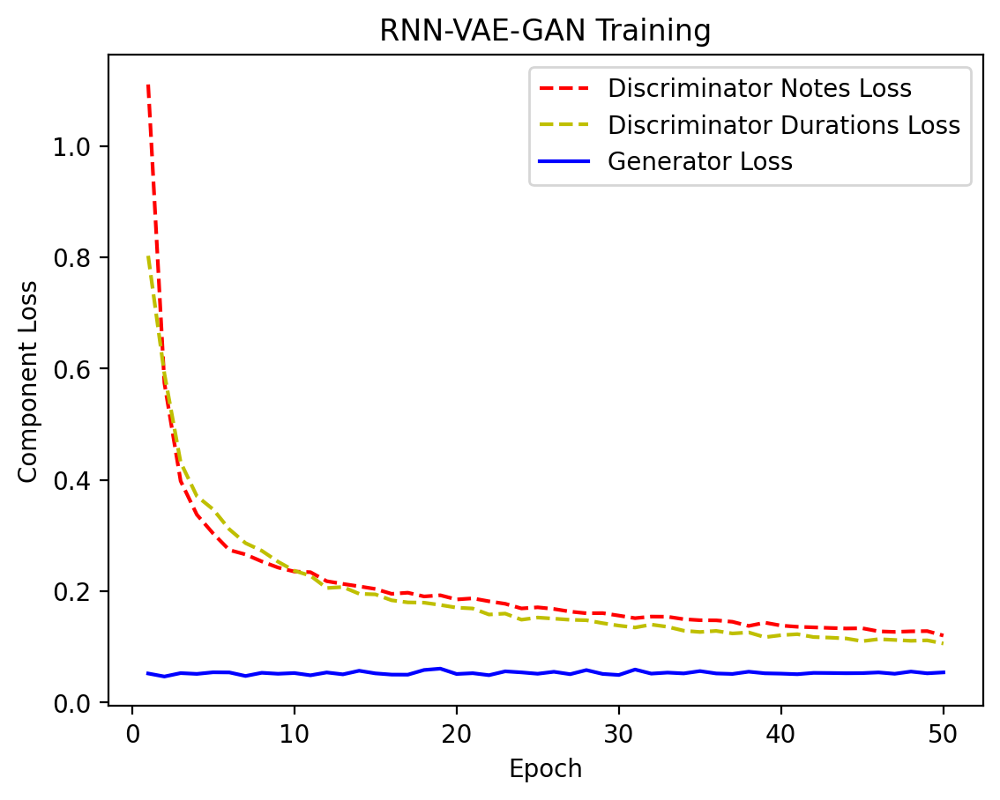

In [ ]:
fus_model_tr = fus_tr.train(generator=generator,discriminator_note=discriminator_note, discriminator_duration = discriminator_duration, gan=fus_model_tr)

## Music Element Prediction - Treble

In [ ]:
pred_tr = fus_model_tr.predict([test_note_tr, test_dur_tr])

1/1 [==============================] - 0s 117ms/step


In [ ]:
pred_tr

[array([[0.01073493, 0.0123024 , 0.00965135, ..., 0.01006787, 0.00896551,
         0.01283113]], dtype=float32),
 array([[0.03616695, 0.03856166, 0.05600083, ..., 0.04144218, 0.03769802,
         0.03747936]], dtype=float32)]

In [ ]:
pred_note_tr = pred_tr[0][0].reshape(sequence_length, n_note_tr)

In [ ]:
pred_note_tr.shape

(100, 103)

In [ ]:
pred_dur_tr = pred_tr[1][0].reshape(sequence_length, n_dur_tr)

In [ ]:
pred_dur_tr

array([[0.03616695, 0.03856166, 0.05600083, ..., 0.03588365, 0.04684188,
        0.03704216],
       [0.04480723, 0.03563834, 0.04305243, ..., 0.03848413, 0.04771157,
        0.03902505],
       [0.06528838, 0.04273953, 0.03765954, ..., 0.03861065, 0.04620877,
        0.03747006],
       ...,
       [0.04505909, 0.03768524, 0.03698232, ..., 0.0471604 , 0.03855139,
        0.0358623 ],
       [0.03728962, 0.04490517, 0.04972804, ..., 0.04218994, 0.05105355,
        0.03654128],
       [0.03458552, 0.04354667, 0.03926705, ..., 0.04144218, 0.03769802,
        0.03747936]], dtype=float32)

## Model Training - Bass

In [ ]:
fus_bs = GanVaeRnn(train_note_bs_flat, train_dur_bs_flat)
generator = fus_bs._generator(num_notes_bs, duration_bs)
discriminator_note = fus_bs._discriminator_note()
discriminator_duration = fus_bs._discriminator_duration()

fus_model_bs = fus_bs._GANVAERNN(generator=generator, discriminator_note=discriminator_note, discriminator_duration = discriminator_duration)

39/39 [==============================] - 17s 398ms/step
>1, d1=0.837, d2=0.668, g=0.126
39/39 [==============================] - 17s 430ms/step
>2, d1=0.605, d2=0.451, g=0.133
39/39 [==============================] - 17s 426ms/step
>3, d1=0.511, d2=0.314, g=0.136
39/39 [==============================] - 16s 400ms/step
>4, d1=0.437, d2=0.246, g=0.130
39/39 [==============================] - 16s 413ms/step
>5, d1=0.377, d2=0.220, g=0.132
39/39 [==============================] - 16s 407ms/step
>6, d1=0.366, d2=0.206, g=0.136
39/39 [==============================] - 16s 409ms/step
>7, d1=0.335, d2=0.201, g=0.126
39/39 [==============================] - 17s 423ms/step
>8, d1=0.327, d2=0.191, g=0.131
39/39 [==============================] - 18s 443ms/step
>9, d1=0.312, d2=0.186, g=0.136
39/39 [==============================] - 16s 415ms/step
>10, d1=0.302, d2=0.181, g=0.134
39/39 [==============================] - 17s 436ms/step
>11, d1=0.285, d2=0.174, g=0.129
39/39 [=======================

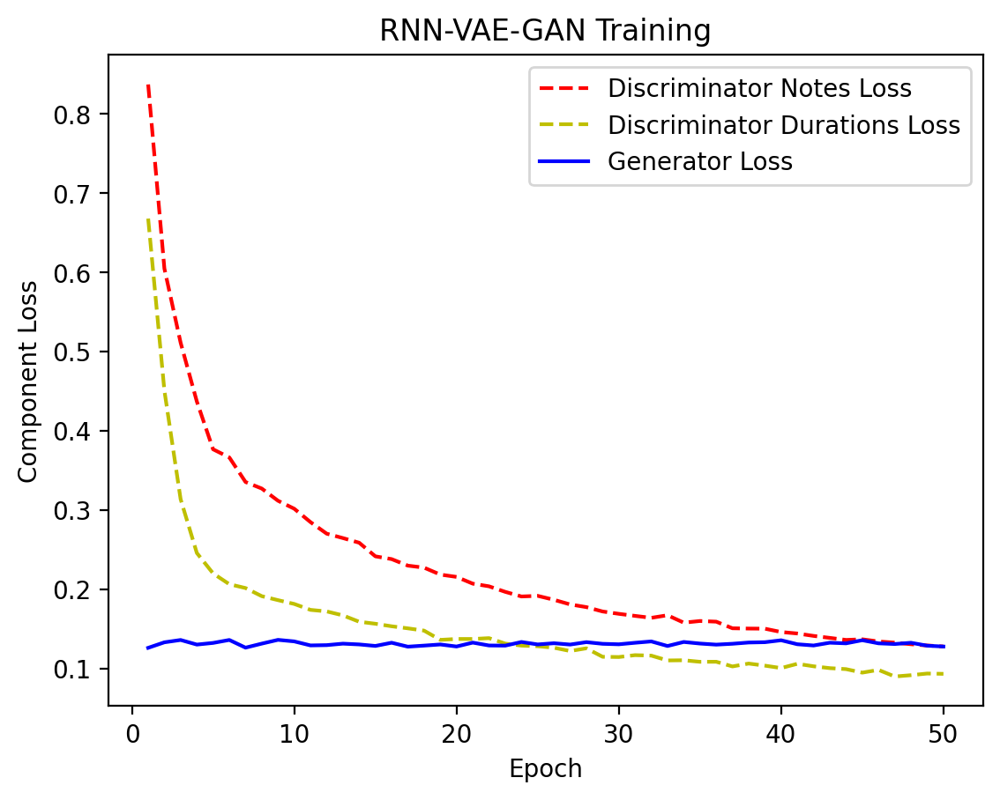

In [ ]:
fus_model_bs = fus_bs.train(generator=generator,discriminator_note=discriminator_note, discriminator_duration = discriminator_duration, gan=fus_model_bs)

## Music Element Prediction - Bass

In [ ]:
pred_bs = fus_model_bs.predict([test_note_bs, test_dur_bs])

1/1 [==============================] - 0s 110ms/step


In [ ]:
pred_bs

[array([[0.01310715, 0.01194144, 0.01537204, ..., 0.01233838, 0.01452668,
         0.01260503]], dtype=float32),
 array([[0.09050655, 0.09861095, 0.09357963, 0.09050237, 0.09720726,
         0.09365051, 0.21303748, 0.10132004, 0.12158522, 0.18004905,
         0.08229215, 0.09969597, 0.12160697, 0.08200311, 0.12757757,
         0.08283822, 0.14708747, 0.0768495 , 0.10095675, 0.11597379,
         0.131759  , 0.10455527, 0.11220971, 0.12102891, 0.10296975,
         0.10851974, 0.10202705, 0.10906971, 0.13445279, 0.13693155,
         0.08699951, 0.1110023 , 0.1043983 , 0.0878986 , 0.09828131,
         0.13096584, 0.12336913, 0.19068445, 0.07975027, 0.11706401,
         0.07863025, 0.10680697, 0.10165472, 0.11889054, 0.08314956,
         0.12228834, 0.10609975, 0.09740685, 0.09602138, 0.09509282,
         0.09463672, 0.16583292, 0.1066084 , 0.1160128 , 0.09615286,
         0.10187312, 0.10979068, 0.10151508, 0.10570706, 0.09627103,
         0.12675017, 0.15400766, 0.10793228, 0.10902424, 0.

In [ ]:
pred_note_bs = pred_bs[0][0].reshape(sequence_length, n_note_bs)

In [ ]:
pred_note_bs[0]

array([0.01310715, 0.01194144, 0.01537204, 0.01226417, 0.01346899,
       0.01552101, 0.01228596, 0.01346102, 0.01249422, 0.01498319,
       0.01162288, 0.01228228, 0.01381019, 0.01432869, 0.01190259,
       0.01221074, 0.01496914, 0.01126683, 0.01192322, 0.01179874,
       0.01246829, 0.0139203 , 0.01456553, 0.01352538, 0.01390839,
       0.01518704, 0.01230343, 0.01308431, 0.0116006 , 0.01182189,
       0.01243978, 0.01178006, 0.01222924, 0.01737   , 0.01317711,
       0.01255809, 0.01793214, 0.01326103, 0.01387537, 0.01334177,
       0.01430908, 0.01628459, 0.01254596, 0.01507543, 0.01226267,
       0.0119914 , 0.01260323, 0.01164575, 0.01138353, 0.01183518,
       0.01383904, 0.01264247, 0.01155674, 0.01312557, 0.0133261 ,
       0.01841908, 0.01382894, 0.0147949 , 0.01755413, 0.01234607,
       0.01486713, 0.01309742, 0.01285899, 0.01249942, 0.0140439 ,
       0.01256592, 0.0126952 , 0.01436677, 0.01262732, 0.01212878,
       0.01450071, 0.01207702, 0.01472314, 0.01198172, 0.01223

In [ ]:
pred_dur_bs = pred_bs[1][0].reshape(sequence_length, n_dur_bs)

In [ ]:
pred_dur_bs

array([[0.09050655, 0.09861095, 0.09357963, 0.09050237, 0.09720726,
        0.09365051, 0.21303748, 0.10132004, 0.12158522],
       [0.18004905, 0.08229215, 0.09969597, 0.12160697, 0.08200311,
        0.12757757, 0.08283822, 0.14708747, 0.0768495 ],
       [0.10095675, 0.11597379, 0.131759  , 0.10455527, 0.11220971,
        0.12102891, 0.10296975, 0.10851974, 0.10202705],
       [0.10906971, 0.13445279, 0.13693155, 0.08699951, 0.1110023 ,
        0.1043983 , 0.0878986 , 0.09828131, 0.13096584],
       [0.12336913, 0.19068445, 0.07975027, 0.11706401, 0.07863025,
        0.10680697, 0.10165472, 0.11889054, 0.08314956],
       [0.12228834, 0.10609975, 0.09740685, 0.09602138, 0.09509282,
        0.09463672, 0.16583292, 0.1066084 , 0.1160128 ],
       [0.09615286, 0.10187312, 0.10979068, 0.10151508, 0.10570706,
        0.09627103, 0.12675017, 0.15400766, 0.10793228],
       [0.10902424, 0.09758814, 0.11380189, 0.11359148, 0.15499249,
        0.09152984, 0.0997998 , 0.10016218, 0.11950988],


# Music Generation

## Top K sampling

In [ ]:
def processing_ouputFUS(predicted_notes, predicted_duration, sequence_length):
  p_element, i_element = tf.math.top_k(predicted_notes,k=10)
  p_duration, i_duration = tf.math.top_k(predicted_duration,k=5)

  p_element = p_element.numpy()
  p_duration = p_duration.numpy()
  i_element = i_element.numpy()
  i_duration = i_duration.numpy()

  generated_notes = []
  generated_durations = []

  for i in range(sequence_length):
    p_element[i] /= p_element[i].sum()
    p_duration[i] /= p_duration[i].sum()

    p_element[i][-1] = 1 - np.sum(p_element[i][0:-1])
    element = np.random.choice(i_element[i], 1, p=p_element[i] )
    generated_notes.append(element[0])

    p_duration[i][-1] = 1 - np.sum(p_duration[i][0:-1])
    duration = np.random.choice(i_duration[i], 1, p=p_duration[i] )
    generated_durations.append(duration[0])

  generated_music_df = pd.DataFrame(list(zip(generated_notes, generated_durations)), columns =['music_element', 'duration'])

  return generated_music_df

function above is for top k sampling.

## Dataframe Construction - Treble

In [ ]:
generated_tr_fus = processing_ouputFUS(pred_note_tr, pred_dur_tr, sequence_length)

In [ ]:
generated_tr_fus

,music_element,duration
0,1,20
1,39,18
2,0,8
3,2,16
4,60,16
...,...,...
95,31,8
96,29,5
97,51,10
98,20,22


## Inverse Label Encoding - Treble

In [ ]:
generated_tr_fus['music_element'] = label_encoder_chord_tr.inverse_transform(generated_tr_fus['music_element'])
generated_tr_fus['duration']= label_encoder_duration_tr.inverse_transform(generated_tr_fus['duration'])

## Inverse Transformation - Treble

In [ ]:
for element_str, element_lst in chords_dict_tr.items():
  generated_tr_fus['music_element'] = generated_tr_fus['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_tr.items():
  generated_tr_fus['duration'] = generated_tr_fus['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
generated_tr_fus

,music_element,duration
0,A3,0.583333
1,"[C#5, B-3]",0.416667
2,A2,2.750000
3,A4,6.000000
4,"[F#5, E4, C#5]",6.000000
...,...,...
95,"[C#4, B-4]",2.750000
96,"[B4, G#4]",2.000000
97,"[E4, C#4, B-4]",3.500000
98,"[B-4, E4, C#5]",0.750000


## Dataframe Construction - Bass

In [ ]:
generated_bs_fus = processing_ouputFUS(pred_note_bs, pred_dur_bs, sequence_length)

In [ ]:
generated_bs_fus

,music_element,duration
0,58,1
1,19,2
2,22,5
3,49,1
4,2,0
...,...,...
95,70,5
96,1,1
97,57,2
98,63,6


## Inverse Label Encoding - Bass

In [ ]:
generated_bs_fus['music_element'] = label_encoder_chord_bs.inverse_transform(generated_bs_fus['music_element'])
generated_bs_fus['duration']= label_encoder_duration_bs.inverse_transform(generated_bs_fus['duration'])

## Inverse Transformation - Bass

In [ ]:
for element_str, element_lst in chords_dict_tr.items():
  generated_bs_fus['music_element'] = generated_bs_fus['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_tr.items():
  generated_bs_fus['duration'] = generated_bs_fus['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
generated_bs_fus

,music_element,duration
0,F#1,0.166667
1,"[B-3, C#4, B-4]",0.250000
2,"[B-4, F#4, C#4]",0.500000
3,D2,0.166667
4,A3,0.083333
...,...,...
95,G1,0.500000
96,A2,0.166667
97,E4,0.250000
98,F2,0.583333


## Music Score and Stream Initialization

In [ ]:
main_stream = stream.Score(id='mainScore')
stream_part1 = stream.Part(id='Part1')
stream_part2 = stream.Part(id='Part2')
instrument1 = instrument.Piano()
clef1 = clef.TrebleClef()
clef2 = clef.BassClef()
tempos = tm2 = tempo.MetronomeMark(number=40)
keys = key.Key(pitch.Pitch('C'))
time_signature = meter.TimeSignature('4/4')
key_order = ['music_element', 'duration']

## Music Stream Construction

In [ ]:
def music_generation_part(stream_part, instrument, clef, tempo, key, time_signature, set_element):

  for i in [instrument, clef, tempo, key, time_signature]:
    stream_part.append(i)

  for notes, durations in zip(set_element[key_order[0]],set_element[key_order[1]]):
    note_name = None

    if type(notes) != list:

      if notes != 'rest':
        note_name = note.Note(notes)
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

      elif notes == 'rest':
        note_name = note.Rest()
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

    elif type(notes) == list:
      note_name = chord.Chord(notes)
      note_name.duration.quarterLength = durations
      stream_part.append(note_name)

  return stream_part

Function above add and submit the generated treble and bass clef data into music stream.

In [ ]:
treble_generation_part_fus = music_generation_part(stream_part1, instrument1, clef1, tempos, keys, time_signature, generated_tr_fus)

In [ ]:
bass_generation_part_fus = music_generation_part(stream_part2, instrument1, clef2, tempos, keys, time_signature, generated_bs_fus)

## Music Streams Balancing

In [ ]:
def convert_to_float(frac_str):
    try:
        return float(frac_str)
    except ValueError:
        num, denom = frac_str.split('/')
        try:
            leading, num = num.split(' ')
            whole = float(leading)
        except ValueError:
            whole = 0
        frac = float(num) / float(denom)
        return whole - frac if whole < 0 else whole + frac

In [ ]:
for i in bass_generation_part_fus:
  if convert_to_float(i.offset) > convert_to_float(treble_generation_part_fus[-1].offset):
    bass_generation_part_fus.remove(i)

for i in treble_generation_part_fus:
  if convert_to_float(i.offset) > convert_to_float(bass_generation_part_fus[-1].offset):
    treble_generation_part_fus.remove(i)

Balancing both treble clef and bass clef generated data to make sure the length of both clef is the same. Noted that, eventhought both have similar sequence, the duration of the notes play importance role in stream length. Where longer duration causes stream length to be longer and vice versa.

## Music Score Construction

In [ ]:
def music_generation_main(main_score, stream_parts_list):
  for i in stream_parts_list:
    main_score.insert(0, i)

  return main_score

In [ ]:
music_generated_fus = music_generation_main(main_stream, [treble_generation_part_fus, bass_generation_part_fus])

Add the music stream of treble clef and bass clef to music score.

# Music Generated

In [ ]:
music_generated_fus.show('text')

{0.0} <music21.stream.Part Part1>
    {0.0} <music21.instrument.Piano 'Piano'>
    {0.0} <music21.clef.TrebleClef>
    {0.0} <music21.tempo.MetronomeMark grave Quarter=40>
    {0.0} <music21.key.Key of C major>
    {0.0} <music21.meter.TimeSignature 4/4>
    {0.0} <music21.note.Note A>
    {0.5833} <music21.chord.Chord C#5 B-3>
    {1.0} <music21.note.Note A>
    {3.75} <music21.note.Note A>
    {9.75} <music21.chord.Chord F#5 E4 C#5>
    {15.75} <music21.chord.Chord B-4 F#4 C#4>
    {16.75} <music21.note.Note D>
    {22.5} <music21.chord.Chord B4 G#4>
    {24.0} <music21.chord.Chord B-3 F#4>
    {28.0} <music21.note.Note G>
    {28.5833} <music21.chord.Chord B-4 F#4>
    {29.0} <music21.note.Note F>
    {29.5833} <music21.chord.Chord B4 E-4>
    {30.3333} <music21.note.Note G>
    {31.0} <music21.chord.Chord C#4 G#4>
    {31.75} <music21.chord.Chord B-4 E4>
    {34.5} <music21.chord.Chord F4 F5>
{0.0} <music21.stream.Part Part2>
    {0.0} <music21.instrument.Piano 'Piano'>
    {0.0} <

## Music Sheet

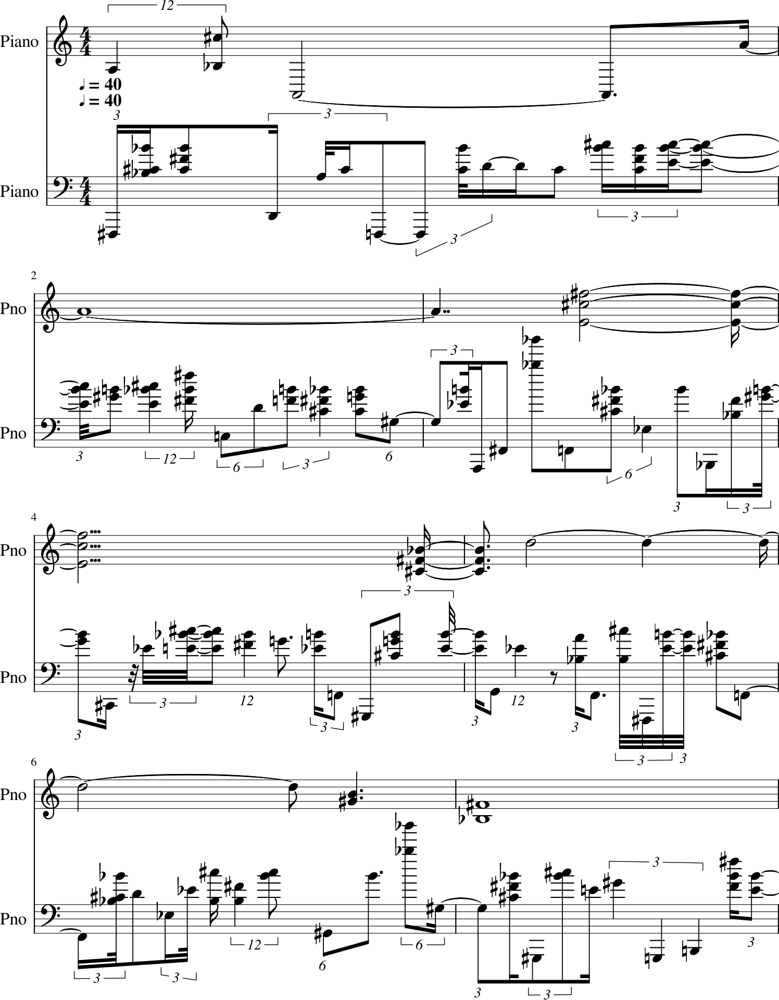

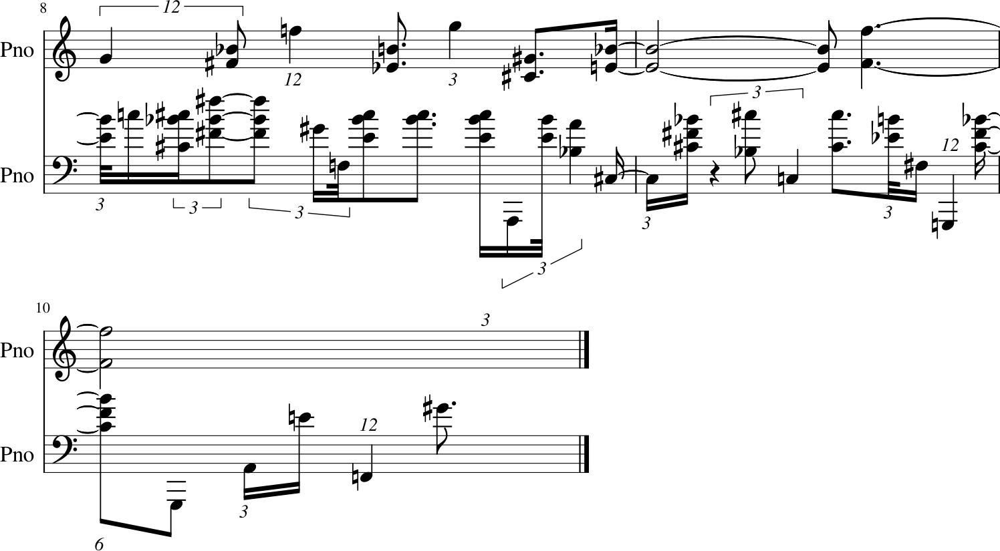

In [ ]:
music_generated_fus.show()

## Music Audio

In [ ]:
play(music_generated_fus)

# Save Model

In [ ]:
fus_model_tr.save("/content/drive/MyDrive/ClassicalMusic/ModelChopin/MugenFUS_tr")

In [ ]:
fus_model_bs.save("/content/drive/MyDrive/ClassicalMusic/ModelChopin/MugenFUS_bs")